# Ensemble 1: constraint spacing vs regional field strength
*_**using true density contrast**_

This notebooks performs 100 synthetic inversions, with all combinations of 10 values of constraint (bathymetry point measurement) spacing, and 10 values of the strength (standard deviation) of the regional component of the gravity field. For each inversion, we assume we know the true density contrast values, which was used to create the synthetic data. 

import packages

In [1]:
%load_ext autoreload
%autoreload 2

import copy
import itertools
import logging
import os
import pathlib
import pickle
import shutil

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import verde as vd
import xarray as xr
import xrft
from invert4geom import inversion, plotting, regional, utils
from polartoolkit import maps
from polartoolkit import utils as polar_utils
from tqdm.autonotebook import tqdm

import synthetic_bathymetry_inversion.plotting as synth_plotting
from synthetic_bathymetry_inversion import synthetic

os.environ["POLARTOOLKIT_HEMISPHERE"] = "south"

logging.getLogger().setLevel(logging.INFO)

/home/mdtanker/miniforge3/envs/synthetic_bathymetry_inversion/lib/python3.12/site-packages/UQpy/__init__.py:6: UserWarning:

pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.



In [2]:
ensemble_path = "../results/Ross_Sea/ensembles/Ross_Sea_ensemble_01_constraint_spacing_vs_regional_strength_true_density"
ensemble_fname = f"{ensemble_path}.csv"

requested spacing (2000.0) is smaller than the original (5000.0).
requested spacing (2000.0) is smaller than the original (5000.0).


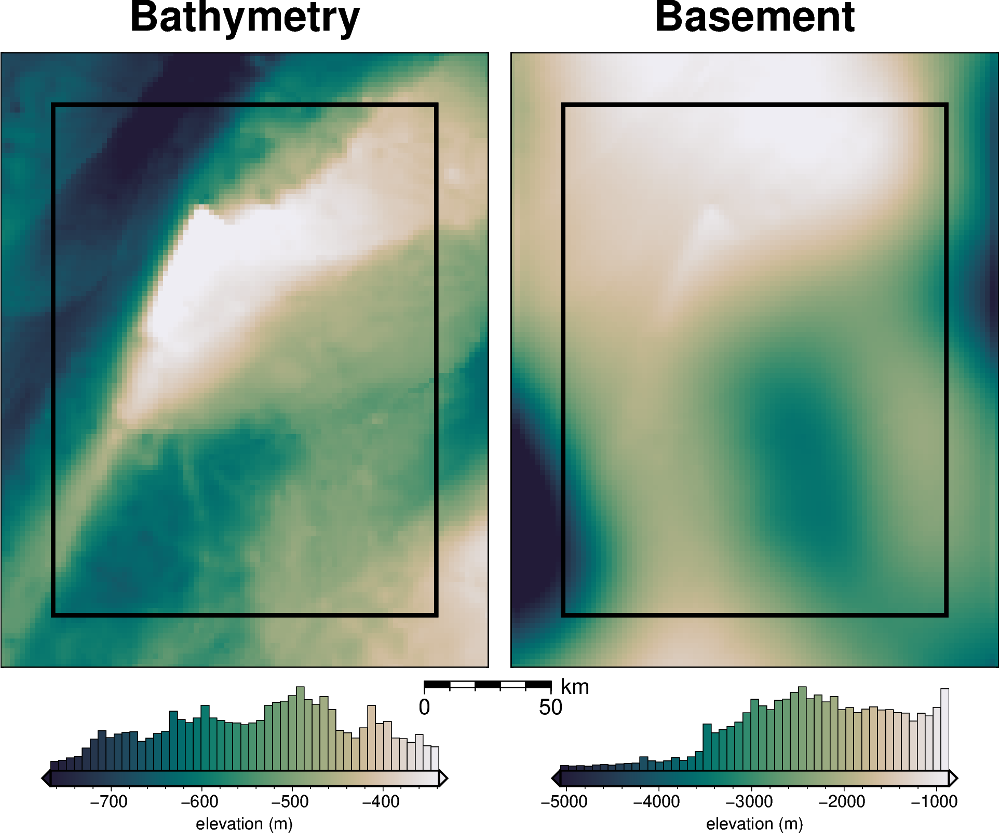

  0%|          | 0/7676 [00:00<?, ?it/s]

  0%|          | 0/7676 [00:00<?, ?it/s]

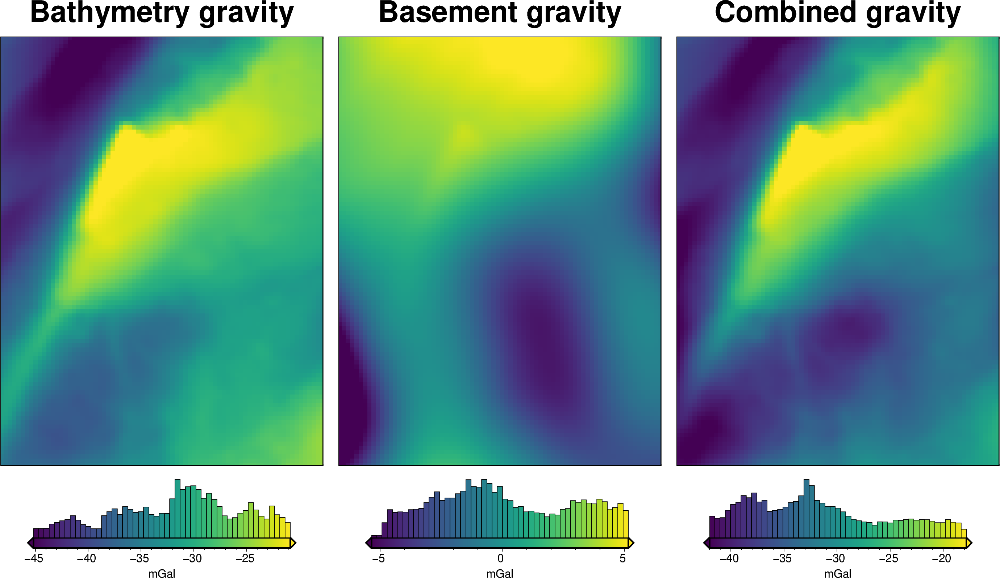

30000.0

In [3]:
# set grid parameters
spacing = 2e3
inversion_region = (-40e3, 110e3, -1600e3, -1400e3)

true_density_contrast = 1476

bathymetry, basement, original_grav_df = synthetic.load_synthetic_model(
    spacing=spacing,
    inversion_region=inversion_region,
    buffer=spacing * 10,
    basement=True,
    zref=0,
    bathymetry_density_contrast=true_density_contrast,
)
buffer_region = polar_utils.get_grid_info(bathymetry)[1]

inversion_area = (
    (inversion_region[1] - inversion_region[0])
    / 1e3
    * (inversion_region[3] - inversion_region[2])
    / 1e3
)
inside_bathymetry = bathymetry.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

inversion_area

In [4]:
# normalize regional gravity between 0 and 1
original_grav_df["basement_grav_normalized"] = (
    vd.grid_to_table(
        utils.normalize_xarray(
            original_grav_df.set_index(["northing", "easting"])
            .to_xarray()
            .basement_grav,
            low=-1,
            high=1,
        )
    )
    .reset_index()
    .basement_grav
)
original_grav_df = original_grav_df.drop(
    columns=["basement_grav", "disturbance", "gravity_anomaly"]
)
original_grav_df

,northing,easting,upward,bathymetry_grav,basement_grav_normalized
0,-1600000.0,-40000.0,1000.0,-35.551085,-0.575645
1,-1600000.0,-38000.0,1000.0,-36.054683,-0.523223
2,-1600000.0,-36000.0,1000.0,-36.473168,-0.466365
3,-1600000.0,-34000.0,1000.0,-36.755627,-0.406022
4,-1600000.0,-32000.0,1000.0,-36.951045,-0.343163
...,...,...,...,...,...
7671,-1400000.0,102000.0,1000.0,-25.760090,0.399167
7672,-1400000.0,104000.0,1000.0,-25.911429,0.334798
7673,-1400000.0,106000.0,1000.0,-26.032814,0.268741
7674,-1400000.0,108000.0,1000.0,-26.121903,0.201716


In [5]:
num = 10

# Define total number of constraints
constraint_numbers = [
    round(x) for x in np.geomspace(4, 650, num)
]  # -> median distance of 17.7-2.5 km, log scale, w/ border

constraint_numbers = [round(i) for i in constraint_numbers]
assert len(pd.Series(constraint_numbers).unique()) == num

# Define regional strength
regional_strengths = [float(round(x, 2)) for x in np.linspace(20, 200, num)]

print("number of constraints:", constraint_numbers)
print("regional strengths:", regional_strengths)

number of constraints: [4, 7, 12, 22, 38, 68, 119, 210, 369, 650]
regional strengths: [20.0, 40.0, 60.0, 80.0, 100.0, 120.0, 140.0, 160.0, 180.0, 200.0]


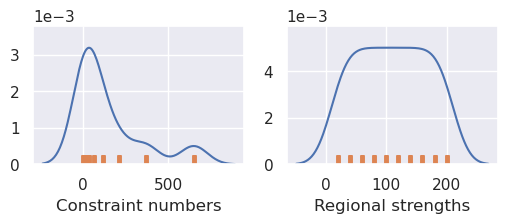

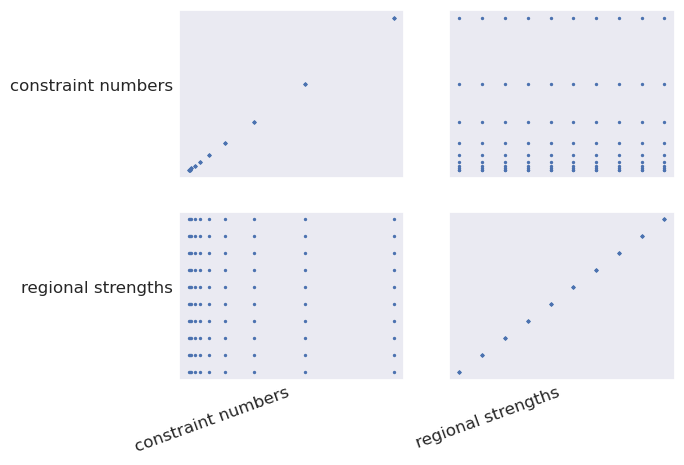

In [6]:
# turn into dataframe
sampled_params_df = pd.DataFrame(
    itertools.product(
        constraint_numbers,
        regional_strengths,
    ),
    columns=[
        "constraint_numbers",
        "regional_strengths",
    ],
)

sampled_params_dict = dict(
    constraint_numbers=dict(sampled_values=sampled_params_df.constraint_numbers),
    regional_strengths=dict(sampled_values=sampled_params_df.regional_strengths),
)

plotting.plot_latin_hypercube(
    sampled_params_dict,
)

In [7]:
sampled_params_df.dtypes

constraint_numbers      int64
regional_strengths    float64
dtype: object

## Create starting models and constraints
Only need to do this for unique combinations of constraint_numbers and constraint_noise_levels

In [8]:
starting_topography_kwargs = dict(
    method="splines",
    region=buffer_region,
    spacing=spacing,
    dampings=None,
)

# get high res grid for computing constraint spacing
bathymetry_highres, _, _ = synthetic.load_synthetic_model(
    spacing=500,
    just_topography=True,
)

# clip to inversion region
bathymetry_highres = bathymetry_highres.sel(
    easting=slice(inversion_region[0], inversion_region[1]),
    northing=slice(inversion_region[2], inversion_region[3]),
)

requested spacing (500.0) is smaller than the original (5000.0).


In [9]:
sampled_params_df["constraint_points_fname"] = np.nan
sampled_params_df["starting_bathymetry_fname"] = np.nan
sampled_params_df["starting_prisms_fname"] = np.nan

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # check if constraint spacing is already done
    # if so, copy it
    subset_with_same_params = sampled_params_df[
        sampled_params_df.constraint_numbers == row.constraint_numbers
    ]
    if (len(subset_with_same_params) > 1) & (
        pd.notna(subset_with_same_params.constraint_points_fname.iloc[0])
    ):
        # copy and rename files
        shutil.copy(
            subset_with_same_params.constraint_points_fname.iloc[0],
            f"{ensemble_path}_constraint_points_{i}.csv",
        )
        shutil.copy(
            subset_with_same_params.starting_bathymetry_fname.iloc[0],
            f"{ensemble_path}_starting_bathymetry_{i}.nc",
        )
        shutil.copy(
            subset_with_same_params.starting_prisms_fname.iloc[0],
            f"{ensemble_path}_starting_prisms_{i}.nc",
        )

        # copy other columns
        sampled_params_df.loc[i, "constraints_starting_rmse"] = (
            subset_with_same_params.constraints_starting_rmse.iloc[0]
        )
        print("skipping and using already created data")
    else:
        # make constraint points
        constraint_points = synthetic.constraint_layout_number(
            num_constraints=row.constraint_numbers,
            region=inversion_region,
            padding=-spacing,
            # plot=True,
            seed=10,
            shapefile="../results/Ross_Sea/Ross_Sea_outline.shp",
            add_outside_points=True,
            grid_spacing=spacing,
        )

        # sample true topography at these points
        constraint_points = utils.sample_grids(
            constraint_points,
            bathymetry,
            "true_upward",
            coord_names=("easting", "northing"),
        )
        constraint_points["upward"] = constraint_points.true_upward

        # grid the sampled values using verde
        starting_bathymetry = utils.create_topography(
            constraints_df=constraint_points,
            **starting_topography_kwargs,
        )

        # sample the inverted topography at the constraint points
        constraint_points = utils.sample_grids(
            constraint_points,
            starting_bathymetry,
            "starting_bathymetry",
            coord_names=("easting", "northing"),
        )

        constraints_rmse = utils.rmse(
            constraint_points.true_upward - constraint_points.starting_bathymetry
        )

        zref = 0

        # make density grid
        density_grid = xr.where(
            starting_bathymetry >= zref,
            true_density_contrast,
            -true_density_contrast,
        )

        # create layer of prisms
        starting_prisms = utils.grids_to_prisms(
            starting_bathymetry,
            zref,
            density=density_grid,
        )

        sampled_params_df.loc[i, "constraints_starting_rmse"] = constraints_rmse
        starting_bathymetry.attrs["damping"] = None

        # save to files
        constraint_points.to_csv(
            f"{ensemble_path}_constraint_points_{i}.csv", index=False
        )
        starting_bathymetry.drop_attrs().to_netcdf(
            f"{ensemble_path}_starting_bathymetry_{i}.nc"
        )
        starting_prisms.to_netcdf(f"{ensemble_path}_starting_prisms_{i}.nc")

    # set file names, add to dataframe
    sampled_params_df.loc[i, "constraint_points_fname"] = (
        f"{ensemble_path}_constraint_points_{i}.csv"
    )
    sampled_params_df.loc[i, "starting_bathymetry_fname"] = (
        f"{ensemble_path}_starting_bathymetry_{i}.nc"
    )
    sampled_params_df.loc[i, "starting_prisms_fname"] = (
        f"{ensemble_path}_starting_prisms_{i}.nc"
    )


sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data
skipping and using already created data


,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356
...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303


In [10]:
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate min dist between each grid cell and nearest constraint
    coords = vd.grid_coordinates(
        region=inversion_region,
        spacing=100,
    )
    grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
    min_dist = utils.dist_nearest_points(
        constraint_points,
        grid,
    ).min_dist

    # mask to the ice shelf outline
    min_dist = polar_utils.mask_from_shp(
        shapefile="../results/Ross_Sea/Ross_Sea_outline.shp",
        grid=min_dist,
        invert=False,
        masked=True,
    )
    # calculate average constraint spacing
    # constraint_spacing =  (
    #     np.median(
    #         vd.median_distance(
    #             (constraint_points.easting, constraint_points.northing),
    #             k_nearest=1,
    #         )
    #     )
    #     / 1e3
    # )
    constraint_proximity = int(min_dist.median().to_numpy()) / 1e3
    sampled_params_df.loc[i, "median_proximity"] = constraint_proximity
    sampled_params_df.loc[i, "maximum_constraint_proximity"] = (
        int(min_dist.max().to_numpy()) / 1e3
    )
    sampled_params_df.loc[i, "constraint_proximity_skewness"] = sp.stats.skew(
        min_dist.to_numpy().ravel(), nan_policy="omit"
    )
    sampled_params_df.loc[i, "constraints_per_10000sq_km"] = (
        len(constraint_points) / inversion_area
    ) * 10e3

sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667
...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667


In [11]:
sampled_params_df[
    [
        "constraint_numbers",
        "median_proximity",
        "maximum_constraint_proximity",
        "constraint_proximity_skewness",
    ]
].describe()

,constraint_numbers,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness
count,100.000000,100.000000,100.000000,100.000000
mean,149.900000,8.919700,25.135300,0.259203
std,200.751844,5.092535,14.650223,0.192085
min,4.000000,2.520000,6.333000,-0.144477
25%,12.000000,4.256000,12.387000,0.146099
50%,53.000000,7.956500,20.771500,0.277189
75%,210.000000,13.483000,38.792000,0.441687
max,650.000000,17.755000,51.305000,0.483691


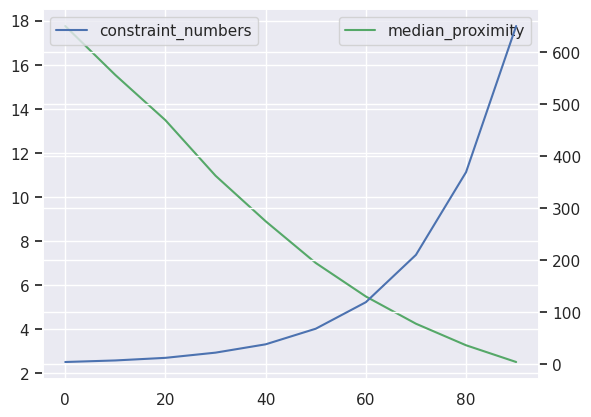

In [12]:
ax = sampled_params_df[::num].median_proximity.plot(c="g")
ax2 = ax.twinx()
ax2 = sampled_params_df[::num].constraint_numbers.plot(ax=ax2)
ax.legend()
ax2.legend()

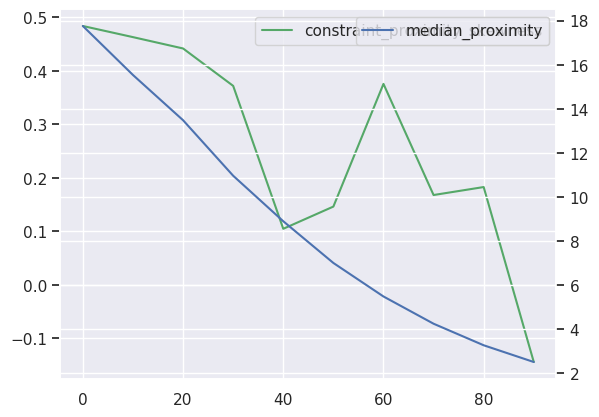

In [13]:
ax = sampled_params_df[::num].constraint_proximity_skewness.plot(c="g")
ax2 = ax.twinx()
ax2 = sampled_params_df[::num].median_proximity.plot(ax=ax2)
ax.legend()
ax2.legend()

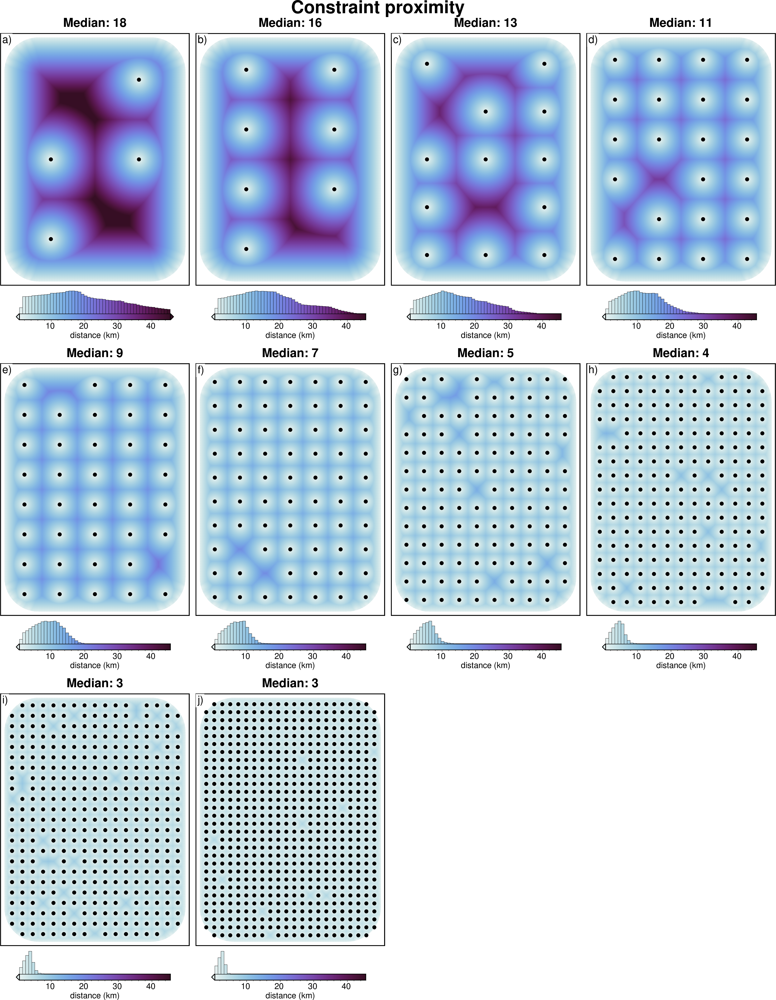

In [14]:
# subplots showing starting bathymetry error
grids = []
titles = []
cbar_labels = []
constraints = []
for i, row in sampled_params_df.iterrows():
    if i % num == 0:
        constraint_points = pd.read_csv(row.constraint_points_fname)

        # calculate min dist between each grid cell and nearest constraint
        coords = vd.grid_coordinates(
            region=inversion_region,
            spacing=100,
        )
        grid = vd.make_xarray_grid(coords, np.ones_like(coords[0]), data_names="z").z
        min_dist = (
            utils.dist_nearest_points(
                constraint_points,
                grid,
            ).min_dist
            / 1e3
        )

        # mask to the ice shelf outline
        min_dist = polar_utils.mask_from_shp(
            shapefile="../results/Ross_Sea/Ross_Sea_outline.shp",
            grid=min_dist,
            invert=False,
            masked=True,
        )

        # add to lists
        grids.append(min_dist)
        titles.append(f"Median: {round(row.median_proximity)}")
        # cbar_labels.append(f"RMSE: {round(utils.rmse(dif),2)} (m)")
        constraints.append(constraint_points[constraint_points.inside])

fig = maps.subplots(
    grids,
    fig_title="Constraint proximity",
    titles=titles,
    cbar_label="distance (km)",
    cmap="dense",
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    point_sets=constraints,
    # points_style="p.02c",
    cbar_font="18p,Helvetica,black",
    yshift_amount=-1.2,
)


fig.show()

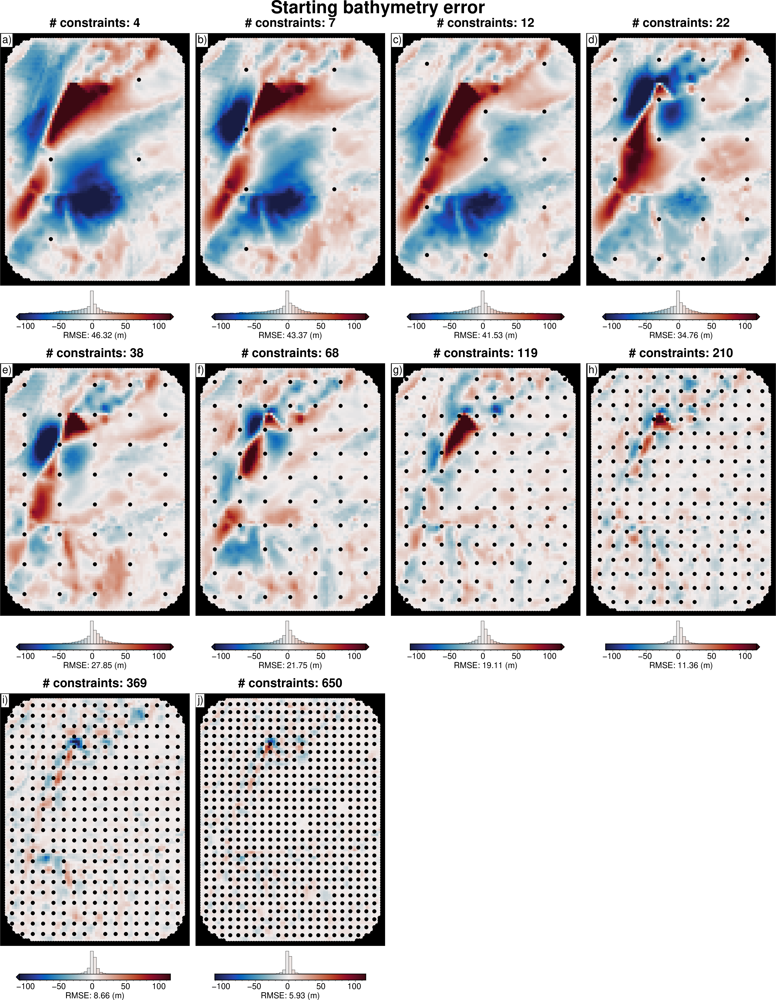

In [15]:
# subplots showing starting bathymetry error
grids = []
titles = []
cbar_labels = []
constraints = []
for i, row in sampled_params_df.iterrows():
    if i % num == 0:
        starting_bathymetry = xr.open_dataarray(row.starting_bathymetry_fname)
        constraint_points = pd.read_csv(row.constraint_points_fname)

        dif = bathymetry - starting_bathymetry

        dif = dif.sel(
            easting=slice(inversion_region[0], inversion_region[1]),
            northing=slice(inversion_region[2], inversion_region[3]),
        )
        # add to lists
        grids.append(dif)
        titles.append(f"# constraints: {round(row.constraint_numbers)}")
        cbar_labels.append(f"RMSE: {round(utils.rmse(dif), 2)} (m)")
        constraints.append(constraint_points)

fig = maps.subplots(
    grids,
    fig_title="Starting bathymetry error",
    titles=titles,
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    point_sets=constraints,
    # points_style="p.02c",
    cbar_font="18p,Helvetica,black",
    yshift_amount=-1.2,
)

fig.show()

In [16]:
sampled_params_df.columns

Index(['constraint_numbers', 'regional_strengths', 'constraint_points_fname',
       'starting_bathymetry_fname', 'starting_prisms_fname',
       'constraints_starting_rmse', 'median_proximity',
       'maximum_constraint_proximity', 'constraint_proximity_skewness',
       'constraints_per_10000sq_km'],
      dtype='object')

  0%|          | 0/100 [00:00<?, ?it/s]

Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 84.59814012867712
Max y value at x value: 34.90619229494806
Max y value at x value: 34.90619229494806
Max y value at x value: 34.90619229494806
Max y value at x value: 21.25768200573872
Max y value at x value: 15.36769046614745
Max y value at x value: 11.988087785514033


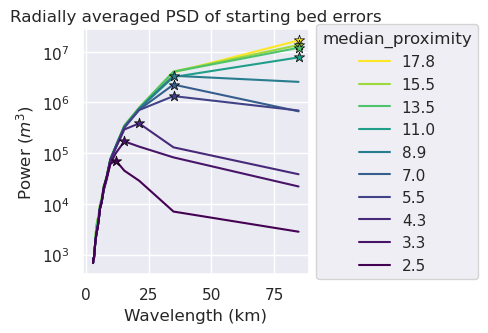

In [17]:
metric = "median_proximity"
grids = []
names = []
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    if i % num == 0:
        starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)

        starting_bathymetry = starting_bathymetry.sel(
            easting=slice(inversion_region[0], inversion_region[1]),
            northing=slice(inversion_region[2], inversion_region[3]),
        )

        grd = inside_bathymetry - starting_bathymetry

        grids.append(grd)
        names.append(round(row[metric], 1))


raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            # detrend='constant',
            detrend="linear",
            # window=False,
            # nfactor=4,
            # spacing_tol=0.01,
            # nfactor=3,
            truncate=False,
        )
    )

fig, ax = plt.subplots(figsize=(5, 3.5))

norm = plt.Normalize(
    vmin=sampled_params_df[metric].min(),
    vmax=sampled_params_df[metric].max(),
)

max_powers = []
max_power_wavelengths = []
for i, da in enumerate(raps_das):
    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=plt.cm.viridis(norm([names[i]])),
    )
    max_ind = da.idxmax()
    max_power = da.max().to_numpy()
    max_power_wavelength = 1 / (da[da == max_power].freq_r.to_numpy()[0]) / 1e3
    max_power_wavelengths.append(max_power_wavelength)
    max_powers.append(max_power)
    ax.scatter(
        x=max_power_wavelength,
        y=max_power,
        marker="*",
        edgecolor="black",
        linewidth=0.5,
        color=plt.cm.viridis(norm(names[i])),  # pylint: disable=no-member
        s=60,
        zorder=20,
    )
    print(f"Max y value at x value: {max_power_wavelength}")

# ax.set_xscale("log")
ax.set_yscale("log")

ax.legend(title=metric, loc="center left", bbox_to_anchor=(1, 0.5))

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("Radially averaged PSD of starting bed errors")
plt.tight_layout()

# ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

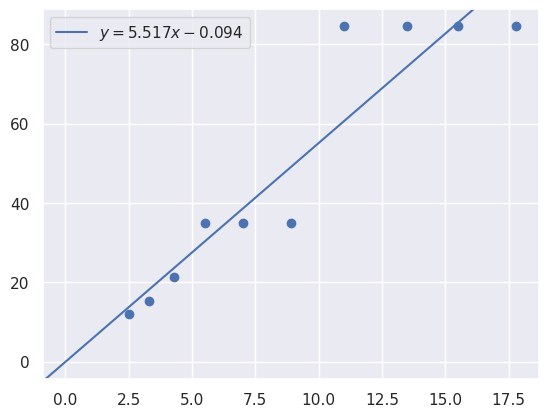

In [18]:
y = max_power_wavelengths
x = names

m, b = np.polyfit(
    x,
    y,
    1,
)

plt.scatter(
    x,
    y,
)

# plot y = m*x + b
plt.axline(xy1=(0, b), slope=m, label=f"$y = {m:.3f}x {b:+.3f}$")
plt.legend()

In [19]:
sampled_params_df["starting_bathymetry_mae"] = pd.Series()
sampled_params_df["starting_bathymetry_rmse"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    starting_bathymetry = xr.load_dataarray(row.starting_bathymetry_fname)

    starting_bathymetry = starting_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    starting_bathymetry_mae = float(
        np.mean(np.abs(inside_bathymetry - starting_bathymetry))
    )
    starting_bathymetry_rmse = utils.rmse(inside_bathymetry - starting_bathymetry)

    sampled_params_df.loc[i, "starting_bathymetry_mae"] = starting_bathymetry_mae
    sampled_params_df.loc[i, "starting_bathymetry_rmse"] = starting_bathymetry_rmse
sampled_params_df

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079


In [20]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [21]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446


## Create observed gravity
* rescale regional field


In [22]:
sampled_params_df["grav_df_fname"] = pd.Series()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # set file names, add to dataframe
    sampled_params_df.loc[i, "grav_df_fname"] = f"{ensemble_path}_grav_df_{i}.csv"

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...


In [23]:
logging.getLogger().setLevel(logging.WARNING)

grav_grid = original_grav_df.set_index(["northing", "easting"]).to_xarray()

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # re-scale the regional gravity
    regional_grav = utils.normalize_xarray(
        grav_grid.basement_grav_normalized,
        low=0,
        high=row.regional_strengths,
    ).rename("basement_grav")
    regional_grav -= regional_grav.mean()

    # add to new dataframe
    grav_df = copy.deepcopy(original_grav_df.drop(columns=["basement_grav_normalized"]))
    grav_df["basement_grav_scaled"] = (
        vd.grid_to_table(regional_grav).reset_index().basement_grav
    )

    # add basement and bathymetry forward gravities together to make observed gravity
    grav_df["gravity_anomaly"] = grav_df.bathymetry_grav + grav_df.basement_grav_scaled

    sampled_params_df.loc[i, "regional_stdev"] = grav_df.basement_grav_scaled.std()

    # save to files
    grav_df.to_csv(row.grav_df_fname, index=False)


sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507


In [24]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [25]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507


In [26]:
sampled_params_df.describe()

,constraint_numbers,regional_strengths,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,regional_stdev
count,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,149.900000,110.000000,0.083960,8.919700,25.135300,0.259203,330.933333,15.135699,26.063274,22.490057
std,200.751844,57.735027,0.095932,5.092535,14.650223,0.192085,66.431876,8.923908,14.282005,11.804219
min,4.000000,20.000000,0.003560,2.520000,6.333000,-0.144477,282.666667,3.335341,5.928079,4.089101
25%,12.000000,60.000000,0.006497,4.256000,12.387000,0.146099,285.333333,6.381553,11.358153,12.267304
50%,53.000000,110.000000,0.045115,7.956500,20.771500,0.277189,299.000000,13.749814,24.798910,22.490057
75%,210.000000,160.000000,0.131168,13.483000,38.792000,0.441687,350.000000,24.695177,41.525873,32.712811
max,650.000000,200.000000,0.283030,17.755000,51.305000,0.483691,496.666667,28.351063,46.321446,40.891013


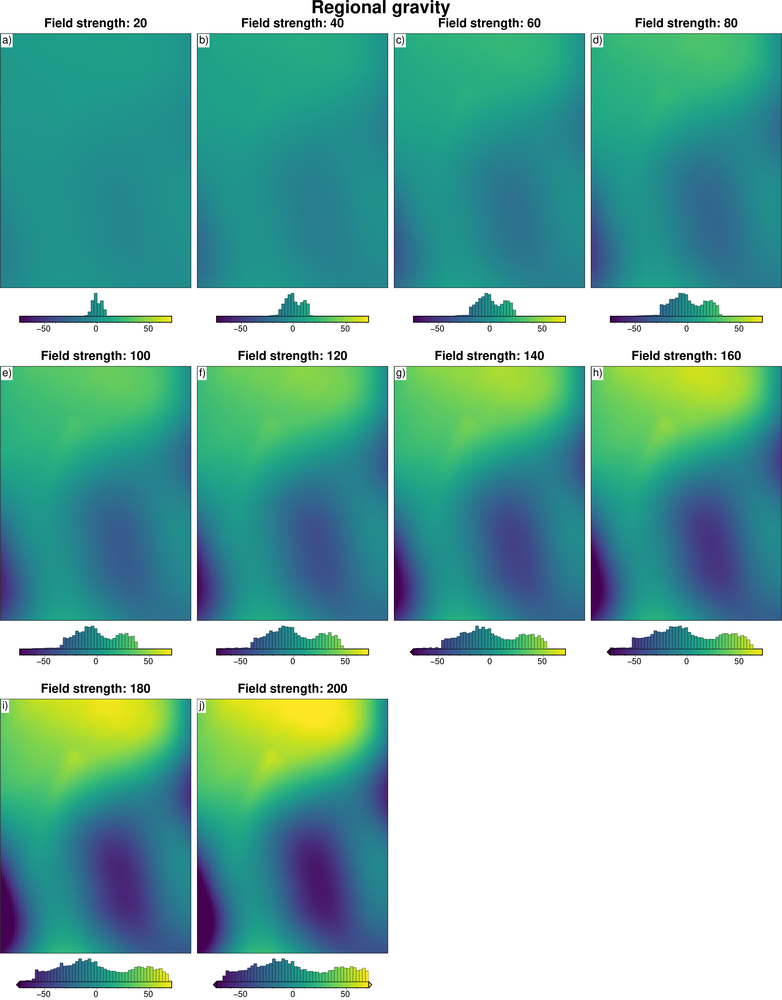

In [27]:
# subplots showing true regional gravity
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = (
            grav_df.set_index(["northing", "easting"]).to_xarray().basement_grav_scaled
        )

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Regional gravity",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    yshift_amount=-1.2,
)

fig.show()

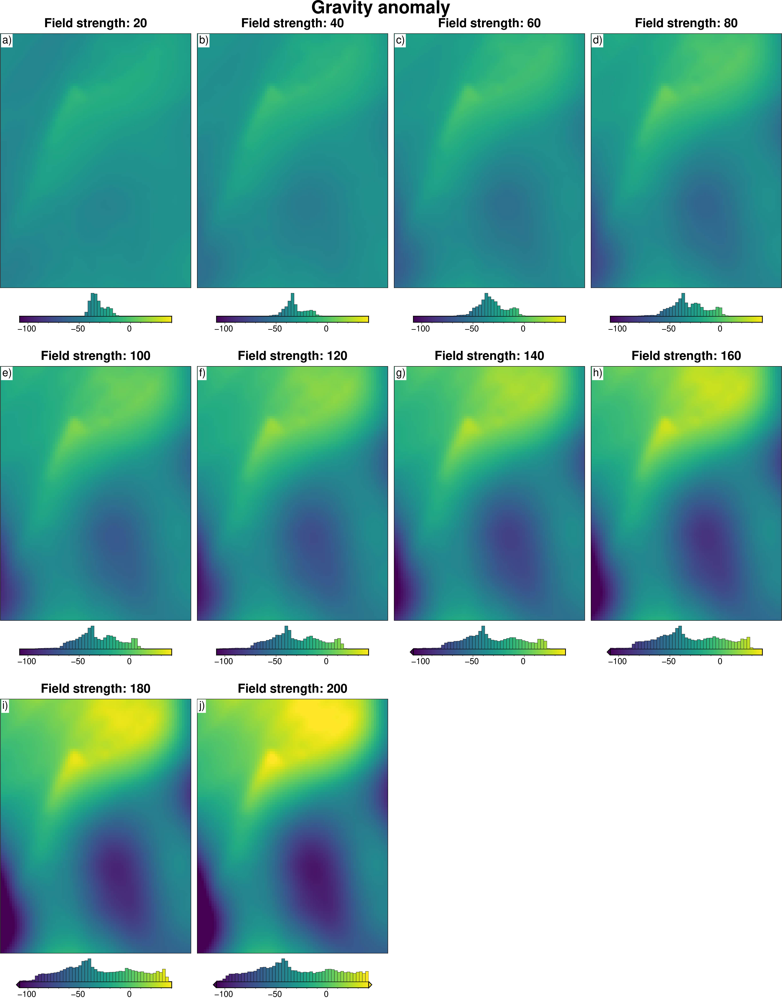

In [28]:
# subplots showing gravity anomaly
grids = []
titles = []
for i, row in (
    sampled_params_df.sort_values(by=["regional_strengths"]).reset_index().iterrows()
):
    if i % num == 0:
        grav_df = pd.read_csv(row.grav_df_fname)

        grid = grav_df.set_index(["northing", "easting"]).to_xarray().gravity_anomaly

        # add to lists
        grids.append(grid)
        titles.append(f"Field strength: {round(row.regional_strengths)}")

fig = maps.subplots(
    grids,
    fig_title="Gravity anomaly",
    titles=titles,
    hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    yshift_amount=-1.2,
)

fig.show()

## Calculate starting gravity and regional

In [29]:
def regional_comparison(df):
    # grid the results
    grav_grid = df.set_index(["northing", "easting"]).to_xarray()

    # compare with true regional
    _ = polar_utils.grd_compare(
        grav_grid.basement_grav,
        grav_grid.reg,
        plot=True,
        grid1_name="True regional misfit",
        grid2_name="Regional misfit",
        hist=True,
        cbar_yoffset=1,
        inset=False,
        verbose="q",
        title="difference",
        grounding_line=False,
        points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
        points_style="x.3c",
    )
    # compare with true residual
    # _ = polar_utils.grd_compare(
    #     grav_grid.true_res,
    #     grav_grid.res,
    #     plot=True,
    #     grid1_name="True residual misfit",
    #     grid2_name="Residual misfit",
    #     cmap="balance+h0",
    #     hist=True,
    #     cbar_yoffset=1,
    #     inset=False,
    #     verbose="q",
    #     title="difference",
    #     grounding_line=False,
    #     points=constraint_points.rename(columns={"easting": "x", "northing": "y"}),
    #     points_style="x.3c",
    # )

In [30]:
# estimate regional
# regional_grav_kwargs = dict(
#     method="constraints",
#     grid_method="eq_sources",
#     cv=True,
#     cv_kwargs=dict(
#         n_trials=50,
#         # damping_limits=(1e-30, 10),
#         depth_limits=(10, 500e3),
#         progressbar=False,
#         fname="../../tmp_outputs/07_regional_sep",
#     ),
#     damping=None,
#     block_size=None,
# )
regional_grav_kwargs = dict(
    method="constraints",
    grid_method="pygmt",
    tension_factor=0,
)

In [31]:
logging.getLogger().setLevel(logging.WARNING)

# sampled_params_df["reg_eqs_damping"] = pd.Series()
# sampled_params_df["reg_eqs_depth"] = pd.Series()
# sampled_params_df["reg_eqs_score"] = pd.Series()


for _i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # calculate the starting gravity
    grav_df["starting_gravity"] = starting_prisms.prism_layer.gravity(
        coordinates=(
            grav_df.easting,
            grav_df.northing,
            grav_df.upward,
        ),
        field="g_z",
        progressbar=False,
    )

    # calculate the true residual misfit
    grav_df["true_res"] = grav_df.bathymetry_grav - grav_df.starting_gravity

    # temporarily set some kwargs
    temp_reg_kwargs = copy.deepcopy(regional_grav_kwargs)
    temp_reg_kwargs["constraints_df"] = constraint_points
    # temp_reg_kwargs["cv_kwargs"]["fname"] = f"../../tmp_outputs/07_regional_sep_{i}"
    # temp_reg_kwargs["cv_kwargs"]["plot"] = False
    # temp_reg_kwargs["cv_kwargs"]["progressbar"] = False

    grav_df = regional.regional_separation(
        grav_df=grav_df,
        **temp_reg_kwargs,
    )
    # regional_comparison(grav_df)

    # # re-load the study from the saved pickle file
    # with pathlib.Path(f"../../tmp_outputs/07_regional_sep_{i}.pickle").open("rb") as f:
    #     reg_study = pickle.load(f)
    # # reg_eq_damping = min(reg_study.best_trials, key=lambda t: t.values[0]).params[
    # #     "damping"
    # # ]
    # reg_eq_depth = min(reg_study.best_trials, key=lambda t: t.values[0]).params["depth"]
    # reg_score = reg_study.best_trial.value

    # # add to dataframe
    # # sampled_params_df.loc[i, "reg_eqs_damping"] = reg_eq_damping
    # sampled_params_df.loc[i, "reg_eqs_depth"] = reg_eq_depth
    # sampled_params_df.loc[i, "reg_eqs_score"] = reg_score

    # resave gravity dataframe
    grav_df.to_csv(row.grav_df_fname, index=False)

sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507


In [32]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [33]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507


In [34]:
# subplots showing grav data loss from sampling and noise
grids = []
cbar_labels = []
row_titles = []
column_titles = []
points = []
# iterate over the ensemble starting with high noise, low line numbers
# row per regional strength and column per constraint numbers
for i, row in sampled_params_df.sort_values(
    by=["regional_strengths", "constraint_numbers"],
    ascending=False,
).iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    grav_df = pd.read_csv(row.grav_df_fname)
    grav_grid = grav_df.set_index(["northing", "easting"]).to_xarray()
    dif = grav_grid.basement_grav_scaled - grav_grid.reg
    # add to lists
    grids.append(dif)
    cbar_labels.append(f"RMSE: {round(utils.rmse(dif), 2)} (mGal)")
    if i % num == 0:
        column_titles.append(f"{row.constraint_numbers} constraints")
    if i < num:
        row_titles.append(f"strength: {round(row.regional_strengths, 1)} mGal")
    points.append(constraint_points[constraint_points.inside])
print(row_titles)
print(column_titles)

fig = maps.subplots(
    grids,
    fig_height=8,
    fig_title="Regional gravity error",
    fig_title_font="75p,Helvetica-Bold,black",
    fig_title_y_offset="5c",
    cbar_labels=cbar_labels,
    cmap="balance+h0",
    # hist=True,
    cpt_lims=polar_utils.get_combined_min_max(grids, robust=True),
    cbar_font="18p,Helvetica,black",
    row_titles=row_titles,
    column_titles=column_titles,
    row_titles_font="25p,Helvetica,black",
    column_titles_font="25p,Helvetica,black",
    point_sets=points,
    points_style="x.2c",
    yshift_amount=-1.2,
)
fig.show()

['strength: 200.0 mGal', 'strength: 180.0 mGal', 'strength: 160.0 mGal', 'strength: 140.0 mGal', 'strength: 120.0 mGal', 'strength: 100.0 mGal', 'strength: 80.0 mGal', 'strength: 60.0 mGal', 'strength: 40.0 mGal', 'strength: 20.0 mGal']
['650 constraints', '369 constraints', '210 constraints', '119 constraints', '68 constraints', '38 constraints', '22 constraints', '12 constraints', '7 constraints', '4 constraints']


In [35]:
sampled_params_df["regional_error"] = np.nan
sampled_params_df["gravity_anomaly_rms"] = np.nan

for i, row in sampled_params_df.iterrows():
    grav_df = pd.read_csv(row.grav_df_fname)

    sampled_params_df.loc[i, "regional_error"] = utils.rmse(
        grav_df.basement_grav_scaled - grav_df.reg
    )
    sampled_params_df.loc[i, "gravity_anomaly_rms"] = utils.rmse(
        grav_df.gravity_anomaly
    )
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101,1.539125,32.531309
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203,3.178885,33.191665
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304,4.822975,34.329642
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405,6.468000,35.899849
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507,8.113437,37.848529
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,24.534608,0.077611,40.120571
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.623709,0.081854,42.664347
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,32.712811,0.086886,45.434237
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,36.801912,0.092579,48.391430


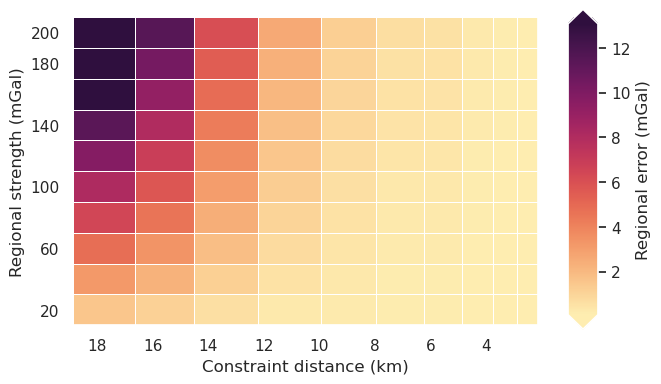

In [36]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Constraint distance (km)",
    # x="constraint_numbers",
    # x_title="Number of constraints",
    # x="constraints_per_10000sq_km",
    # x_title="Constraints per $10000 km^2$",
    y="regional_strengths",
    y_title="Regional strength (mGal)",
    background="regional_error",
    background_title="Regional error (mGal)",
    # plot_title="Constraint spacing vs regional strength",
    background_robust=True,
    # logx=True,
    flipx=True,
    constrained_layout=False,
)

## Inversion with true density contrast

In [37]:
for i, row in sampled_params_df.iterrows():
    # set results file name, add results file name
    sampled_params_df.loc[i, "results_fname"] = f"{ensemble_path}_results_{i}"
    sampled_params_df.loc[i, "inverted_bathymetry_fname"] = (
        f"{ensemble_path}_inverted_bathymetry_{i}.nc"
    )
sampled_params_df

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,results_fname,inverted_bathymetry_fname
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101,1.539125,32.531309,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203,3.178885,33.191665,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304,4.822975,34.329642,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405,6.468000,35.899849,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507,8.113437,37.848529,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,650,120.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,24.534608,0.077611,40.120571,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
96,650,140.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,28.623709,0.081854,42.664347,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
97,650,160.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,32.712811,0.086886,45.434237,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...
98,650,180.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.28303,2.520,6.333,-0.144477,496.666667,3.335341,5.928079,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,36.801912,0.092579,48.391430,../results/Ross_Sea/ensemble

In [38]:
logging.getLogger().setLevel(logging.WARNING)

for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load data
    starting_prisms = xr.load_dataset(row.starting_prisms_fname)
    grav_df = pd.read_csv(row.grav_df_fname)

    # set kwargs to pass to the inversion
    kwargs = {
        # set stopping criteria
        "max_iterations": 200,
        "l2_norm_tolerance": 0.2**0.5,  # square root of the gravity noise
        "delta_l2_norm_tolerance": 1.008,
        "solver_damping": 0.025,
    }

    # run the inversion workflow, including a cross validation for the damping parameter
    _ = inversion.run_inversion_workflow(
        grav_df=grav_df,
        starting_prisms=starting_prisms,
        # for creating test/train splits
        # grav_spacing=spacing,
        # inversion_region=inversion_region,
        # run_damping_cv=True,
        # damping_limits=(0.001, 0.1),
        # damping_cv_trials=8,
        # damping_limits=(0.025, 0.025),
        # damping_cv_trials=1,
        # damping_cv_startup_trials=1,
        # damping_cv_progressbar=False,
        # plot_cv=True,
        fname=row.results_fname,
        **kwargs,
    )

    sampled_params_df.head()

  0%|          | 0/100 [00:00<?, ?it/s]

In [39]:
for i, row in sampled_params_df.iterrows():
    constraint_points = pd.read_csv(row.constraint_points_fname)

    # load saved inversion results
    with pathlib.Path(f"{row.results_fname}_results.pickle").open("rb") as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    # collect the results
    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    # sample the inverted topography at the constraint points
    constraint_points = utils.sample_grids(
        constraint_points,
        final_bathymetry,
        f"inverted_bathymetry_{i}",
        coord_names=("easting", "northing"),
    )
    constraints_rmse = utils.rmse(
        constraint_points.true_upward - constraint_points[f"inverted_bathymetry_{i}"]
    )

    # clip to inversion region
    final_bathymetry_inside = final_bathymetry.sel(
        easting=slice(inversion_region[0], inversion_region[1]),
        northing=slice(inversion_region[2], inversion_region[3]),
    )

    inversion_rmse = utils.rmse(inside_bathymetry - final_bathymetry_inside)

    # save final topography to file
    final_bathymetry.to_netcdf(row.inverted_bathymetry_fname)

    # add to dataframe
    sampled_params_df.loc[i, "constraints_rmse"] = constraints_rmse
    sampled_params_df.loc[i, "inversion_rmse"] = inversion_rmse

sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,starting_bathymetry_mae,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,results_fname,inverted_bathymetry_fname,constraints_rmse,inversion_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101,1.539125,32.531309,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.423019,26.648249
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203,3.178885,33.191665,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.884680,54.908343
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304,4.822975,34.329642,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.432129,83.360788
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405,6.468000,35.899849,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.024054,111.912020
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,28.351063,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507,8.113437,37.848529,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.643112,140.546153


In [40]:
sampled_params_df["topo_improvement_rmse"] = (
    sampled_params_df.starting_bathymetry_rmse - sampled_params_df.inversion_rmse
)

In [41]:
sampled_params_df.to_csv(ensemble_fname, index=False)

In [3]:
sampled_params_df = pd.read_csv(ensemble_fname)
sampled_params_df.head()

,constraint_numbers,regional_strengths,constraint_points_fname,starting_bathymetry_fname,starting_prisms_fname,constraints_starting_rmse,median_proximity,maximum_constraint_proximity,constraint_proximity_skewness,constraints_per_10000sq_km,...,starting_bathymetry_rmse,grav_df_fname,regional_stdev,regional_error,gravity_anomaly_rms,results_fname,inverted_bathymetry_fname,constraints_rmse,inversion_rmse,topo_improvement_rmse
0,4,20.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,...,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,4.089101,1.539125,32.531309,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.423019,26.648249,19.673197
1,4,40.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,...,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,8.178203,3.178885,33.191665,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,1.884680,54.908343,-8.586897
2,4,60.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,...,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,12.267304,4.822975,34.329642,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,2.432129,83.360788,-37.039342
3,4,80.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,...,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,16.356405,6.468000,35.899849,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.024054,111.912020,-65.590574
4,4,100.0,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,0.00356,17.755,51.305,0.483691,282.666667,...,46.321446,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,20.445507,8.113437,37.848529,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,../results/Ross_Sea/ensembles/Ross_Sea_ensembl...,3.643112,140.546153,-94.224708


## Examine results

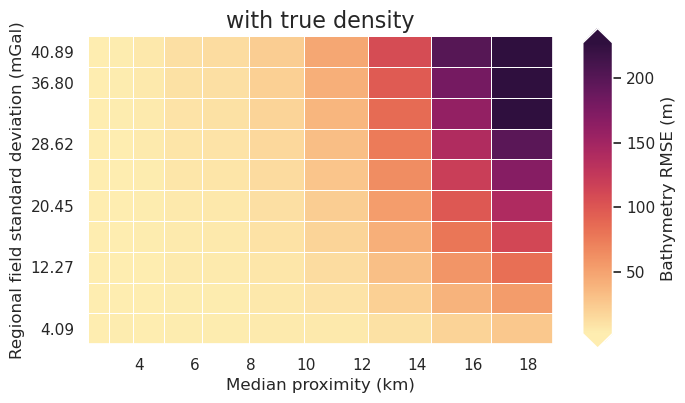

In [4]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="inversion_rmse",
    background_title="Bathymetry RMSE (m)",
    background_robust=True,
    # logx=True,
    # flipx=True,
    constrained_layout=False,
    plot_title="with true density",
)

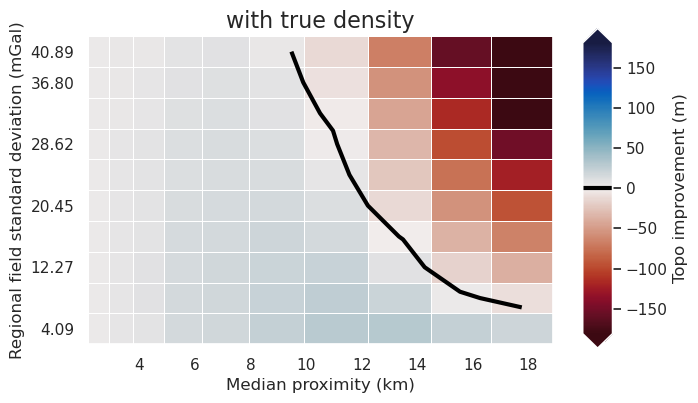

In [5]:
fig = synth_plotting.plot_2var_ensemble(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_title="Median proximity (km)",
    y="regional_stdev",
    y_title="Regional field standard deviation (mGal)",
    background="topo_improvement_rmse",
    background_title="Topo improvement (m)",
    background_cmap="cmo.balance_r",
    background_cpt_lims=polar_utils.get_min_max(
        sampled_params_df.topo_improvement_rmse,
        robust=True,
        absolute=True,
    ),
    plot_contours=[0],
    contour_color="black",
    constrained_layout=False,
    plot_title="with true density",
)

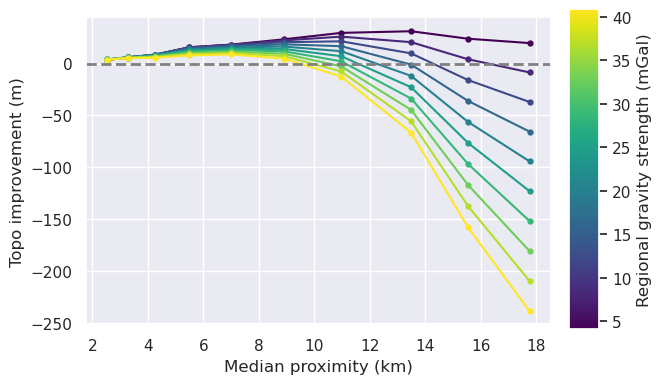

In [45]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(6, 4),
    x="median_proximity",
    x_label="Median proximity (km)",
    # x="constraints_per_10000sq_km",
    # x_label="Constraints per $10000 km^2$",
    y="topo_improvement_rmse",
    y_label="Topo improvement (m)",
    groupby_col="regional_stdev",
    cbar_label="Regional gravity strength (mGal)",
    horizontal_line=0,
)

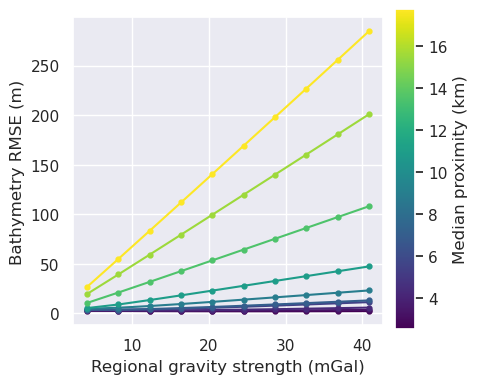

In [46]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="inversion_rmse",
    y_label="Bathymetry RMSE (m)",
    groupby_col="median_proximity",
    cbar_label="Median proximity (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    # slope_min_max=True,
    # slope_mean=True,
)

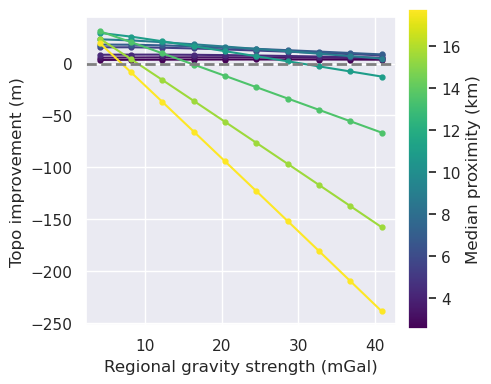

In [47]:
fig = synth_plotting.plot_ensemble_as_lines(
    sampled_params_df,
    figsize=(4, 4),
    x="regional_stdev",
    x_label="Regional gravity strength (mGal)",
    y="topo_improvement_rmse",
    y_label="Topo improvement (m)",
    groupby_col="median_proximity",
    cbar_label="Median proximity (km)",
    # groupby_col="constraints_per_10000sq_km",
    # cbar_label="Constraints per $10000 km^2$",
    trend_line=True,
    horizontal_line=0,
    # slope_min_max=True,
    # slope_mean=True,
)

  0%|          | 0/100 [00:00<?, ?it/s]

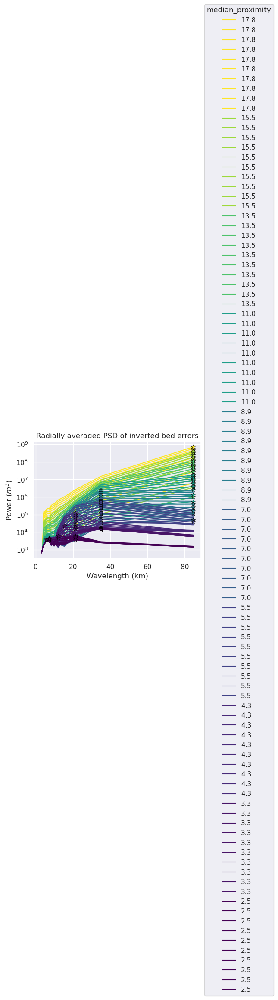

In [48]:
metric = "median_proximity"
grids = []
names = []
for i, row in tqdm(sampled_params_df.iterrows(), total=len(sampled_params_df)):
    # load saved inversion results
    with pathlib.Path(f"{row.results_fname}_results.pickle").open("rb") as f:
        topo_results, grav_results, parameters, elapsed_time = pickle.load(f)

    final_bathymetry = topo_results.set_index(["northing", "easting"]).to_xarray().topo

    grd = inside_bathymetry - final_bathymetry

    grids.append(grd)
    names.append(round(row[metric], 1))

# grids.append(inside_bathymetry)
# names.append(0)


raps_das = []
for i, g in enumerate(grids):
    raps_das.append(
        xrft.isotropic_power_spectrum(
            g,
            dim=["easting", "northing"],
            # detrend='constant',
            detrend="linear",
            # window=False,
            # nfactor=4,
            # spacing_tol=0.01,
            # nfactor=3,
            truncate=False,
        )
    )

fig, ax = plt.subplots(figsize=(5, 3.5))

norm = plt.Normalize(
    vmin=sampled_params_df[metric].min(),
    vmax=sampled_params_df[metric].max(),
)

max_powers = []
max_power_wavelengths = []
for i, da in enumerate(raps_das):
    ax.plot(
        (1 / da.freq_r) / 1e3,
        da,
        label=names[i],
        color=plt.cm.viridis(norm([names[i]])),
    )
    max_ind = da.idxmax()
    max_power = da.max().to_numpy()
    max_power_wavelength = 1 / (da[da == max_power].freq_r.to_numpy()[0]) / 1e3
    max_power_wavelengths.append(max_power_wavelength)
    max_powers.append(max_power)
    ax.scatter(
        x=max_power_wavelength,
        y=max_power,
        marker="*",
        edgecolor="black",
        linewidth=0.5,
        color=plt.cm.viridis(norm(names[i])),  # pylint: disable=no-member
        s=60,
        zorder=20,
    )
    # print(f"Max y value at x value: {max_power_wavelength}")

# ax.set_xscale("log")
ax.set_yscale("log")

ax.legend(title=metric, loc="center left", bbox_to_anchor=(1, 0.5))

ax.set_xlabel("Wavelength (km)")
ax.set_ylabel("Power ($m^3$)")
ax.set_title("Radially averaged PSD of inverted bed errors")
plt.tight_layout()

# ax.xaxis.set_major_formatter(mpl.ticker.StrMethodFormatter("{x:.1f}"))

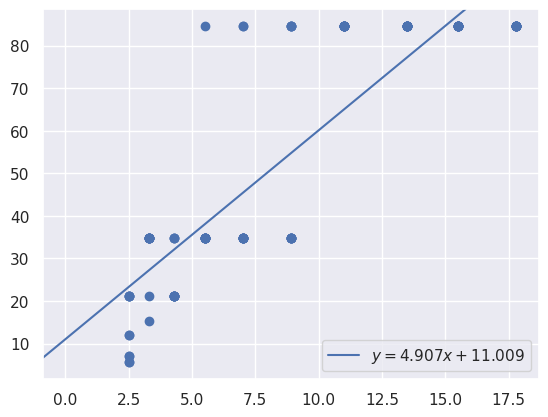

In [49]:
y = max_power_wavelengths
x = names

m, b = np.polyfit(
    x,
    y,
    1,
)

plt.scatter(
    x,
    y,
)

# plot y = m*x + b
plt.axline(xy1=(0, b), slope=m, label=f"$y = {m:.3f}x {b:+.3f}$")
plt.legend()